### Import libraries ==>  Load data ==>  plot data ==>  Analyze data ==> Build Models ==>  Conclude conclusion 

In [15]:
import seaborn as sns
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt       # matplotlib.pyplot plots data
from matplotlib.ticker import MaxNLocator
from matplotlib.gridspec import GridSpec
from sklearn import metrics
from plotly import tools
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn import model_selection
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import roc_curve,auc
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier
import matplotlib.patches as patches
from scipy import interp
import matplotlib.gridspec as gridspec
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from mlxtend.plotting import plot_learning_curves
from mlxtend.plotting import plot_decision_regions
from mlxtend.classifier import StackingClassifier
from datetime import datetime
import plotly.offline as pyo
pyo.init_notebook_mode()
from scipy import stats 
import itertools
sns.set(color_codes = True)
%matplotlib inline 
np.set_printoptions(linewidth=500)
init_notebook_mode(connected=True)  

##### Read CSV file as Dataframe named "bank". Quick glance at 1st 5 records of "bank" dataframe

In [2]:
bank = pd.read_csv('D:\\bank-full.csv')

In [3]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


### BANK dataset has 17 cols (features) & 45211 records. 
#### Categoricals cols : job, marital, education, default,housing,loan,contact,month,poutcome,Target
#### Numerical cols : Age, Balance, Day, Duration, Campaign, pdays, previous
#### Fortunately, there are no missing values. If there were missing values we will have to fill them with the median, mean or mode. I tend to use the median but in this scenario there is no need to fill any missing values. This will definitely make our job easier!

In [5]:
bank.shape

(45211, 17)

In [6]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [7]:
bank.isnull().values.any()

False

In [8]:
bank.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

In [9]:
bank.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


Balance & poutcome has negative numbers.

In [10]:
print('Mean Balance :',bank.balance.mean())
print('Min Balance :',bank.balance.min())
print('Max Balance :',bank.balance.max())

Mean Balance : 1362.2720576850766
Min Balance : -8019
Max Balance : 102127


In [11]:
print(bank[bank["pdays"] < 0 ]["contact"].value_counts())
print()
print()
print(bank[bank["pdays"] < 0 ]["education"].value_counts())
print()
print()
print(bank[bank["pdays"] < 0 ]["job"].value_counts())

cellular     21729
unknown      12950
telephone     2275
Name: contact, dtype: int64


secondary    18948
tertiary     10641
primary       5831
unknown       1534
Name: education, dtype: int64


blue-collar      8115
management       7632
technician       6255
admin.           4082
services         3448
retired          1776
self-employed    1298
entrepreneur     1262
unemployed       1090
housemaid        1088
student           653
unknown           255
Name: job, dtype: int64


In [12]:
bank.job.value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

##### Data is having a huge bias (almost 1:11) towards the category of people not subscribed to Term Deposit.
##### Lets explore dependent column TARGET relationship with rest of the Independent Cols

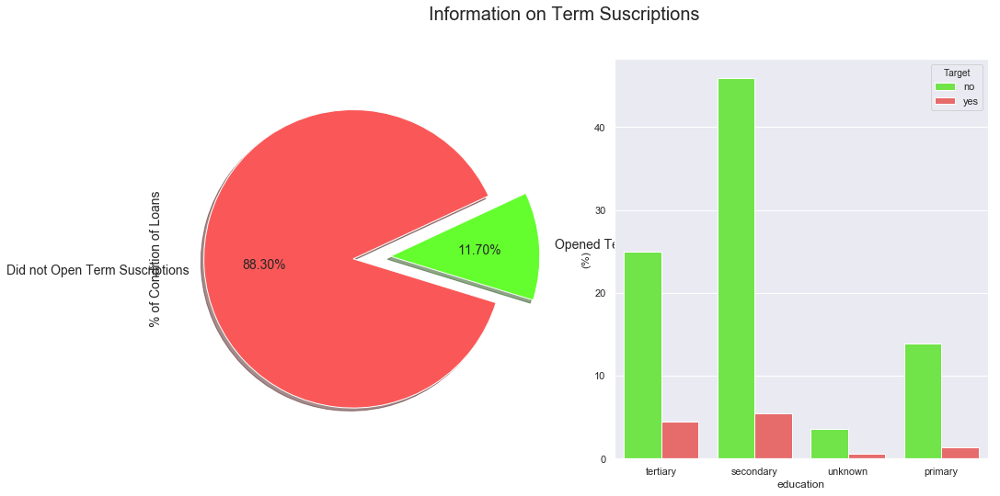

In [13]:
f, ax = plt.subplots(1,2, figsize=(16,8))

colors = ["#FA5858", "#64FE2E"]
labels ="Did not Open Term Suscriptions", "Opened Term Suscriptions"

plt.suptitle('Information on Term Suscriptions', fontsize=20)

bank["Target"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', ax=ax[0], shadow=True, colors=colors, 
                                             labels=labels, fontsize=14, startangle=25)


# ax[0].set_title('State of Loan', fontsize=16)
ax[0].set_ylabel('% of Condition of Loans', fontsize=14)

# sns.countplot('loan_condition', data=df, ax=ax[1], palette=colors)
# ax[1].set_title('Condition of Loans', fontsize=20)
# ax[1].set_xticklabels(['Good', 'Bad'], rotation='horizontal')
palette = ["#64FE2E", "#FA5858"]

sns.barplot(x="education", y="balance", hue="Target", data=bank, palette=palette, estimator=lambda x: len(x) / len(bank) * 100)
ax[1].set(ylabel="(%)")
ax[1].set_xticklabels(bank["education"].unique(), rotation=0, rotation_mode="anchor")
plt.show()


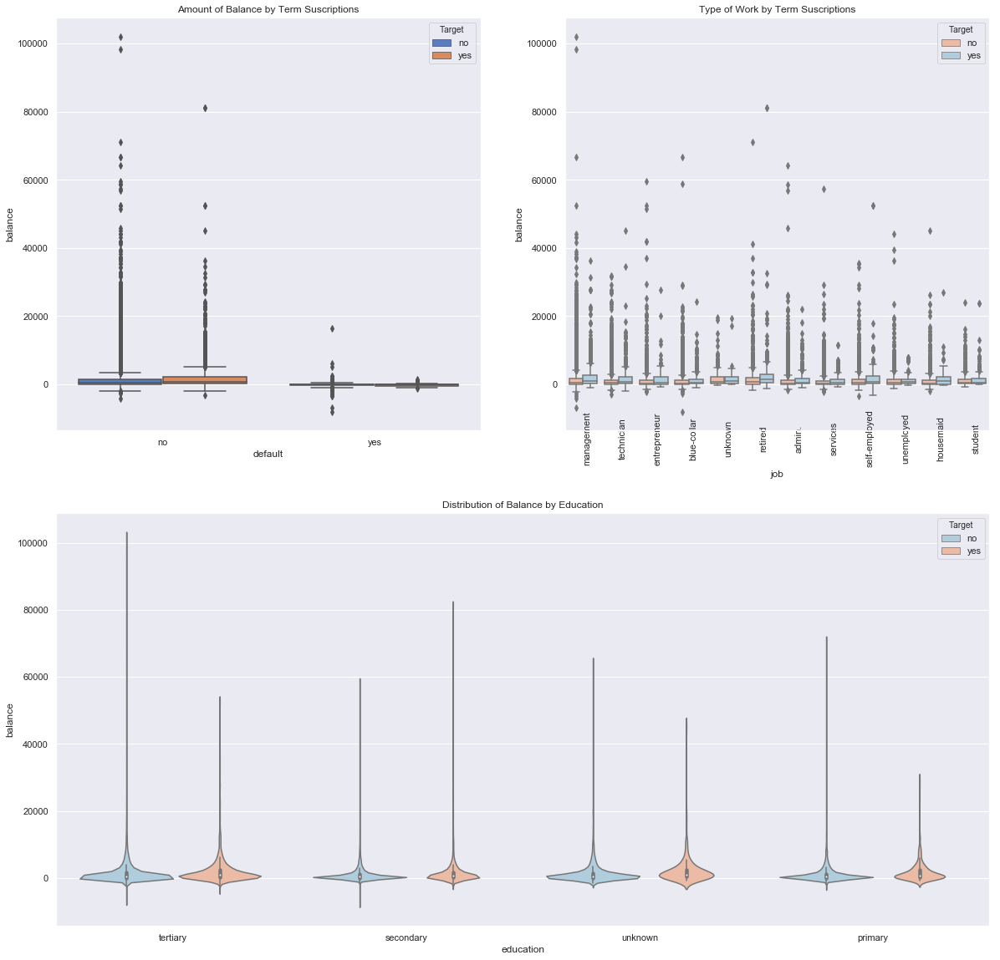

In [14]:
# plt.style.use('dark_background')
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(212)

g = sns.boxplot(x="default", y="balance", hue="Target",
                    data=bank, palette="muted", ax=ax1)

g.set_title("Amount of Balance by Term Suscriptions")

g1 = sns.boxplot(x="job", y="balance", hue="Target",
                 data=bank, palette="RdBu", ax=ax2)

g1.set_xticklabels(bank["job"].unique(), rotation=90, rotation_mode="anchor")
g1.set_title("Type of Work by Term Suscriptions")

g2 = sns.violinplot(data=bank, x="education", y="balance", hue="Target", palette="RdBu_r")
g2.set_title("Distribution of Balance by Education")
plt.show()

### Analysis by Occupation
Management is the occupation that is more prevalent in this dataset.

Age by Occupation: As expected, the retired are the ones who have the highest median age while student are the lowest.

Balance by Occupation: Management and Retirees are the ones who have the highest balance in their accounts.

In [17]:
# Now let's see which occupation tended to have more balance in their accounts

suscribed_bank = bank.loc[bank["Target"] == "yes"]

occupations = bank["job"].unique().tolist()

# Get the balances by jobs
management = suscribed_bank["age"].loc[suscribed_bank["job"] == "management"].values
technician = suscribed_bank["age"].loc[suscribed_bank["job"] == "technician"].values
services = suscribed_bank["age"].loc[suscribed_bank["job"] == "services"].values
retired = suscribed_bank["age"].loc[suscribed_bank["job"] == "retired"].values
blue_collar = suscribed_bank["age"].loc[suscribed_bank["job"] == "blue-collar"].values
unemployed = suscribed_bank["age"].loc[suscribed_bank["job"] == "unemployed"].values
entrepreneur = suscribed_bank["age"].loc[suscribed_bank["job"] == "entrepreneur"].values
housemaid = suscribed_bank["age"].loc[suscribed_bank["job"] == "housemaid"].values
self_employed = suscribed_bank["age"].loc[suscribed_bank["job"] == "self-employed"].values
student = suscribed_bank["age"].loc[suscribed_bank["job"] == "student"].values


ages = [management, technician, services, retired, blue_collar, unemployed, 
         entrepreneur, housemaid, self_employed, student]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)',
          'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 
          'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)',
         'rgba(229, 126, 56, 0.5)', 'rgba(229, 56, 56, 0.5)',
         'rgba(174, 229, 56, 0.5)', 'rgba(229, 56, 56, 0.5)']

traces = []

for xd, yd, cls in zip(occupations, ages, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints='all',
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Distribution of Ages by Occupation',
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=5,
        gridcolor='rgb(255, 255, 255)',
        gridwidth=1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='rgb(224,255,246)',
    plot_bgcolor='rgb(251,251,251)',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
#iplot(fig)

pyo.iplot(fig, filename = 'basic-line')

In [18]:
# Balance Distribution

# Create a Balance Category
bank["balance_status"] = np.nan
lst = [bank]

for col in lst:
    col.loc[col["balance"] < 0, "balance_status"] = "negative"
    col.loc[(col["balance"] >= 0) & (col["balance"] <= 30000), "balance_status"] = "low"
    col.loc[(col["balance"] > 30000) & (col["balance"] <= 40000), "balance_status"] = "middle"
    col.loc[col["balance"] > 40000, "balance_status"] = "high"
    
# balance by balance_status
negative = bank["balance"].loc[bank["balance_status"] == "negative"].values.tolist()
low = bank["balance"].loc[bank["balance_status"] == "low"].values.tolist()
middle = bank["balance"].loc[bank["balance_status"] == "middle"].values.tolist()
high = bank["balance"].loc[bank["balance_status"] == "high"].values.tolist()


# Get the average by occupation in each balance category
job_balance = bank.groupby(['job', 'balance_status'])['balance'].mean()


trace1 = go.Barpolar(
    r=[-199.0, -392.0, -209.0, -247.0, -233.0, -270.0, -271.0, 0, -276.0, -134.5],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed"],
    name='Negative Balance',
    marker=dict(
        color='rgb(246, 46, 46)'
    )
)
trace2 = go.Barpolar(
    r=[319.5, 283.0, 212.0, 313.0, 409.0, 274.5, 308.5, 253.0, 316.0, 330.0],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed"],
    name='Low Balance',
    marker=dict(
        color='rgb(246, 97, 46)'
    )
)
trace3 = go.Barpolar(
    r=[2128.5, 2686.0, 2290.0, 2366.0, 2579.0, 2293.5, 2005.5, 2488.0, 2362.0, 1976.0],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed"],
    name='Middle Balance',
    marker=dict(
        color='rgb(246, 179, 46)'
    )
)
trace4 = go.Barpolar(
    r=[14247.5, 20138.5, 12278.5, 12956.0, 20723.0, 12159.0, 12223.0, 13107.0, 12063.0, 15107.5],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed"],
    name='High Balance',
    marker=dict(
        color='rgb(46, 246, 78)'
    )
)
data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='Mean Balance in Account<br> <i> by Job Occupation</i>',
    font=dict(
        size=12
    ),
    legend=dict(
        font=dict(
            size=16
        )
    ),
    radialaxis=dict(
        ticksuffix='%'
    ),
    orientation=270
)
fig = go.Figure(data=data, layout=layout)
#iplot(fig, filename='polar-area-chart')
pyo.iplot(fig, filename = 'polar-area-chart')

#### Marital Status
Well in this analysis we didn't find any significant insights other than most divorced individuals are broke. No wonder since they have to split financial assets! Nevertheless, since no further insights have been found we will proceed to clustering marital status with education status. Let's see if we can find other groups of people in the sample population.

In [17]:
bank.marital.value_counts()

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

In [19]:
vals = bank['marital'].value_counts().tolist()
labels = ['married', 'divorced', 'single']

data = [go.Bar(
            x=labels,
            y=vals,
    marker=dict(
    color="#FE9A2E")
    )]

layout = go.Layout(
    title="Count by Marital Status",
)

fig = go.Figure(data=data, layout=layout)

#iplot(fig, filename='basic-bar')
pyo.iplot(fig, filename = 'basic-bar')

In [20]:
# Distribution of Balances by Marital status
single = bank['balance'].loc[bank['marital'] == 'single'].values
married = bank['balance'].loc[bank['marital'] == 'married'].values
divorced = bank['balance'].loc[bank['marital'] == 'divorced'].values


single_dist = go.Histogram(
    x=single,
    histnorm='density', 
    name='single',
    marker=dict(
        color='#6E6E6E'
    )
)


married_dist = go.Histogram(
    x=married,
    histnorm='density', 
    name='married',
    marker=dict(
        color='#2E9AFE'
    )
)

divorced_dist = go.Histogram(
    x=divorced,
    histnorm='density', 
    name='divorced',
    marker=dict(
        color='#FA5858'
    )
)


fig = tools.make_subplots(rows=3, print_grid=False)

fig.append_trace(single_dist, 1, 1)
fig.append_trace(married_dist, 2, 1)
fig.append_trace(divorced_dist, 3, 1)


fig['layout'].update(showlegend=False, title="Price Distributions by Marital Status",
                    height=1000, width=800)

#iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

pyo.iplot(fig, filename = 'custom-sized-subplot-with-subplot-titles')

In [21]:
# Notice how divorced have a considerably low amount of balance.
fig = ff.create_facet_grid(
    bank,
    x='duration',
    y='balance',
    color_name='marital',
    show_boxes=False,
    marker={'size': 10, 'opacity': 1.0},
    colormap={'single': 'rgb(165, 242, 242)', 'married': 'rgb(253, 174, 216)', 'divorced': 'rgba(201, 109, 59, 0.82)'}
)

#iplot(fig, filename='facet - custom colormap')
pyo.iplot(fig, filename = 'facet - custom colormap')

In [21]:
# Hmmm We have missed some important clients with some high balances. 
# This shouldn't be happening.
fig = ff.create_facet_grid(
    bank,
    y='balance',
    facet_row='marital',
    facet_col='Target',
    trace_type='box',
)

iplot(fig, filename='facet - box traces')

#### Clustering Marital Status and Education
Marital Status: As discussed previously, the impact of a divorce has a significant impact on the balance of the individual.
Education: The level of education also has a significant impact on the amount of balance a prospect has.
Loans: Whether the prospect has a previous loan has a significant impact on the amount of balance he or she has.

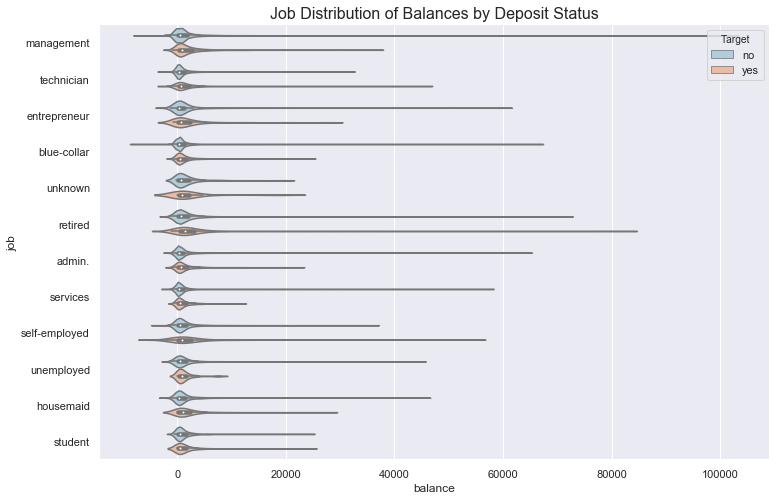

In [22]:
fig = plt.figure(figsize=(12,8))

sns.violinplot(x="balance", y="job", hue="Target", palette="RdBu_r",
            data=bank);

plt.title("Job Distribution of Balances by Deposit Status", fontsize=16)

plt.show()

#### Campaign Duration
Hmm, we see that duration has a high correlation with term deposits meaning the higher the duration, the more likely it is for a client to open a term deposit.
Average Campaign Duration: The average campaign duration is 374.76, let's see if clients that were above this average were more likely to open a term deposit.
Duration Status: People who were above the duration status, were more likely to open a term deposit. 78% of the group that is above average in duration opened term deposits while those that were below average 32% opened term deposit accounts. This tells us that it will be a good idea to target individuals who are in the above average category.

In [23]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
age               45211 non-null int64
job               45211 non-null object
marital           45211 non-null object
education         45211 non-null object
default           45211 non-null object
balance           45211 non-null int64
housing           45211 non-null object
loan              45211 non-null object
contact           45211 non-null object
day               45211 non-null int64
month             45211 non-null object
duration          45211 non-null int64
campaign          45211 non-null int64
pdays             45211 non-null int64
previous          45211 non-null int64
poutcome          45211 non-null object
Target            45211 non-null object
balance_status    45211 non-null object
dtypes: int64(7), object(11)
memory usage: 6.2+ MB


               age   balance       day  duration  campaign     pdays  previous
age       1.000000  0.097783 -0.009120 -0.004648  0.004760 -0.023758  0.001288
balance   0.097783  1.000000  0.004503  0.021560 -0.014578  0.003435  0.016674
day      -0.009120  0.004503  1.000000 -0.030206  0.162490 -0.093044 -0.051710
duration -0.004648  0.021560 -0.030206  1.000000 -0.084570 -0.001565  0.001203
campaign  0.004760 -0.014578  0.162490 -0.084570  1.000000 -0.088628 -0.032855
pdays    -0.023758  0.003435 -0.093044 -0.001565 -0.088628  1.000000  0.454820
previous  0.001288  0.016674 -0.051710  0.001203 -0.032855  0.454820  1.000000


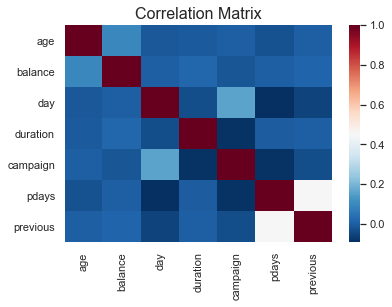

In [24]:
# Separate both dataframes into 
numeric_bank = bank.select_dtypes(exclude="object")
categorical_df = bank.select_dtypes(include="object")

corr_numeric = numeric_bank.corr()
print(corr_numeric)

sns.heatmap(corr_numeric, cbar=True, cmap="RdBu_r")
plt.title("Correlation Matrix", fontsize=16)
plt.show()

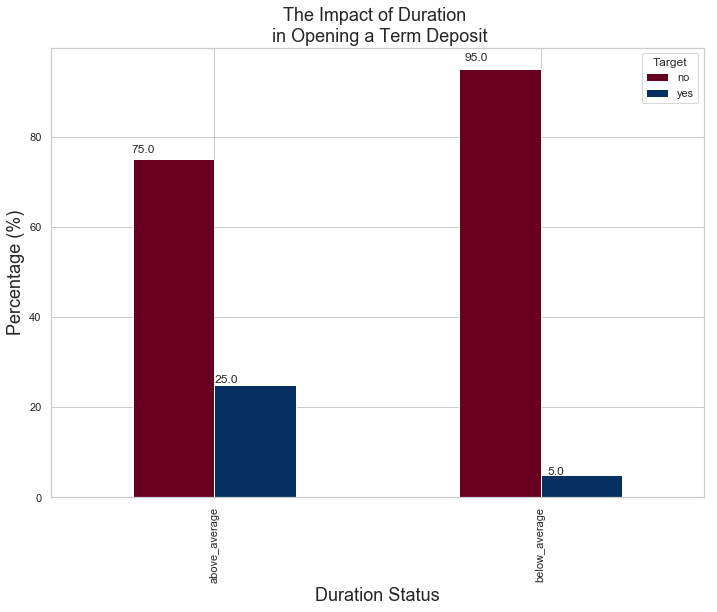

In [25]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')
avg_duration = bank['duration'].mean()

lst = [bank]
bank["duration_status"] = np.nan

for col in lst:
    col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
    col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
pct_term = pd.crosstab(bank['duration_status'], bank['Target']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
plt.title("The Impact of Duration \n in Opening a Term Deposit", fontsize=18)
plt.xlabel("Duration Status", fontsize=18);
plt.ylabel("Percentage (%)", fontsize=18)

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    
plt.show()

In [26]:
print(numeric_bank.columns) ## bank.select_dtypes(exclude="object")
print(categorical_df.info()) ## bank.select_dtypes(include="object")

Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 11 columns):
job               45211 non-null object
marital           45211 non-null object
education         45211 non-null object
default           45211 non-null object
housing           45211 non-null object
loan              45211 non-null object
contact           45211 non-null object
month             45211 non-null object
poutcome          45211 non-null object
Target            45211 non-null object
balance_status    45211 non-null object
dtypes: object(11)
memory usage: 3.8+ MB
None


In [27]:
#Label encoding all the categorical columns
bank1=bank.drop(['duration_status'],axis=1)
le = preprocessing.LabelEncoder()
encoded_bank = pd.DataFrame()
for i in bank1.columns:
    if i in categorical_df:
        encoded_bank[i] = le.fit_transform(bank1[i])
    else:
        encoded_bank[i] = bank1[i]

In [28]:
encoded_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
age               45211 non-null int64
job               45211 non-null int32
marital           45211 non-null int32
education         45211 non-null int32
default           45211 non-null int32
balance           45211 non-null int64
housing           45211 non-null int32
loan              45211 non-null int32
contact           45211 non-null int32
day               45211 non-null int64
month             45211 non-null int32
duration          45211 non-null int64
campaign          45211 non-null int64
pdays             45211 non-null int64
previous          45211 non-null int64
poutcome          45211 non-null int32
Target            45211 non-null int32
balance_status    45211 non-null int32
dtypes: int32(11), int64(7)
memory usage: 4.3 MB


In [29]:
encoded_bank.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211.0,4.339762,3.272657,0.0,1.0,4.0,7.0,11.0
marital,45211.0,1.167725,0.608230,0.0,1.0,1.0,2.0,2.0
education,45211.0,1.224813,0.747997,0.0,1.0,1.0,2.0,3.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
contact,45211.0,0.640242,0.897951,0.0,0.0,0.0,2.0,2.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


In [30]:
encoded_bank.corr()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,balance_status
age,1.000000,-0.021868,-0.403240,-0.106807,-0.017879,0.097783,-0.185513,-0.015655,0.026221,-0.009120,-0.042357,-0.004648,0.004760,-0.023758,0.001288,0.007367,0.025155,-0.041927
job,-0.021868,1.000000,0.062045,0.166707,-0.006853,0.018232,-0.125363,-0.033004,-0.082063,0.022856,-0.092870,0.004744,0.006839,-0.024455,-0.000911,0.011010,0.040438,-0.030450
marital,-0.403240,0.062045,1.000000,0.108576,-0.007023,0.002122,-0.016096,-0.046893,-0.039201,-0.005261,-0.006991,0.011852,-0.008994,0.019172,0.014973,-0.016850,0.045588,-0.028741
education,-0.106807,0.166707,0.108576,1.000000,-0.010718,0.064514,-0.090790,-0.048574,-0.110928,0.022671,-0.057304,0.001935,0.006255,0.000052,0.017570,-0.019361,0.066241,-0.050913
default,-0.017879,-0.006853,-0.007023,-0.010718,1.000000,-0.066745,-0.006025,0.077234,0.015404,0.009424,0.011486,-0.010021,0.016822,-0.029979,-0.018329,0.034898,-0.022419,0.223458
balance,0.097783,0.018232,0.002122,0.064514,-0.066745,1.000000,-0.068768,-0.084350,-0.027273,0.004503,0.019777,0.021560,-0.014578,0.003435,0.016674,-0.020967,0.052838,-0.176106
housing,-0.185513,-0.125363,-0.016096,-0.090790,-0.006025,-0.068768,1.000000,0.041323,0.188123,-0.027982,0.271481,0.005075,-0.023599,0.124178,0.037076,-0.099971,-0.139173,0.104079
loan,-0.015655,-0.033004,-0.046893,-0.048574,0.077234,-0.084350,0.041323,1.000000,-0.010873,0.011370,0.022145,-0.012412,0.009980,-0.022754,-0.011043,0.015458,-0.068185,0.132179
contact,0.026221,-0.082063,-0.039201,-0.110928,0.015404,-0.027273,0.188123,-0.010873,1.000000,-0.027936,0.361145,-0.020839,0.019614,-0.244816,-0.147811,0.272214,-0.148395,0.059621
day,-0.009120,0.022856,-0.005261,0.022671,0.009424,0.004503,-0.027982,0.011370,-0.027936,1.000000,-0.006028,-0.030206,0.162490,-0.093044,-0.051710,0.083460,-0.028348,0.023736


Target
0    [[AxesSubplot(0.125,0.758226;0.158163x0.121774...
1    [[AxesSubplot(0.125,0.758226;0.158163x0.121774...
dtype: object

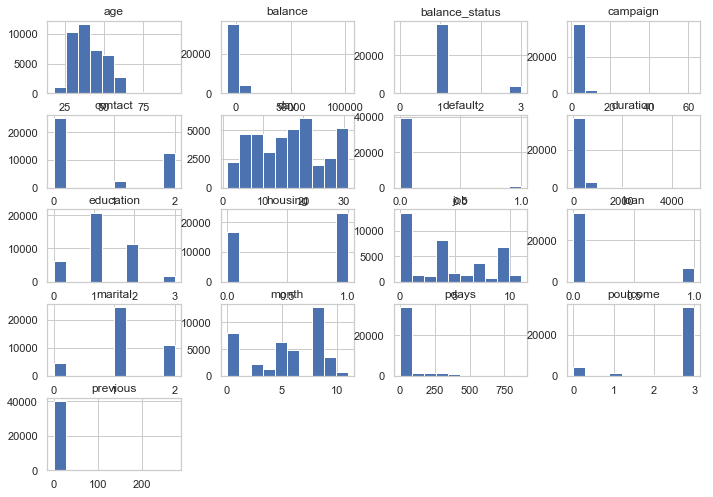

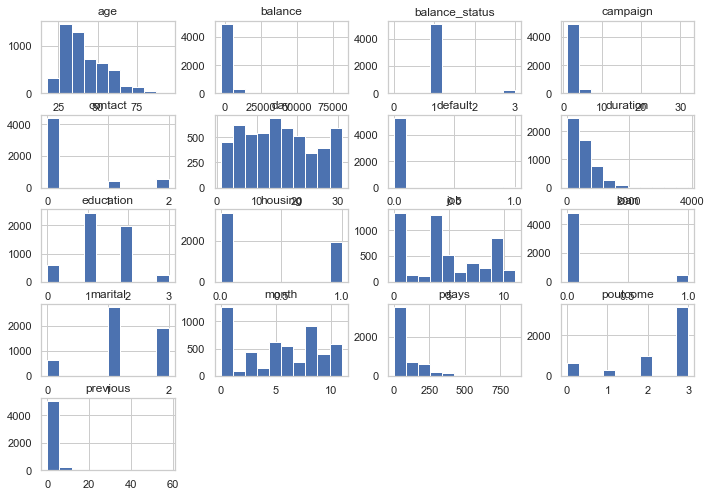

In [31]:
#Feature-Class Relationships
#The next important relationship to explore is that of each attribute to the class attribute.

encoded_bank.groupby('Target').hist()

Target
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: age, dtype: object

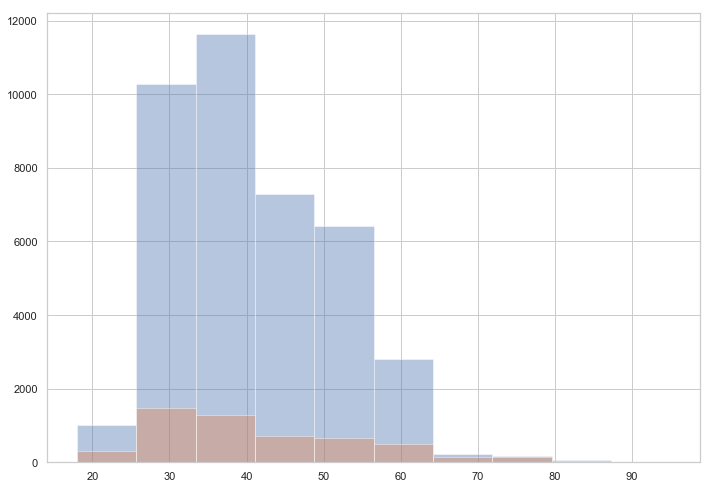

In [32]:
encoded_bank.groupby('Target').age.hist(alpha=0.4)

In [ ]:
bank.groupby('Target').month.hist(alpha=0.4)

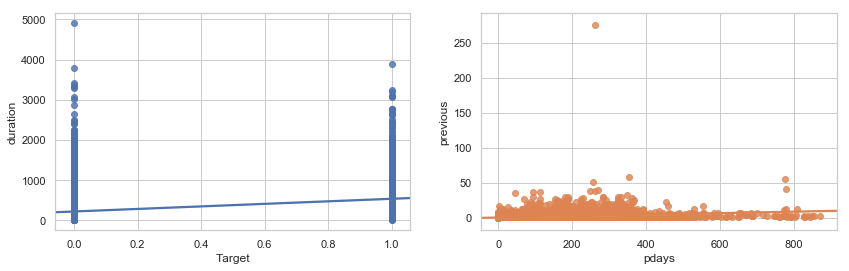

In [33]:
fig, axes = plt.subplots(1,2, figsize = (14,4))
sns.regplot(encoded_bank["Target"],encoded_bank["duration"],ax=axes[0])
sns.regplot(encoded_bank["pdays"],encoded_bank["previous"],ax=axes[1])

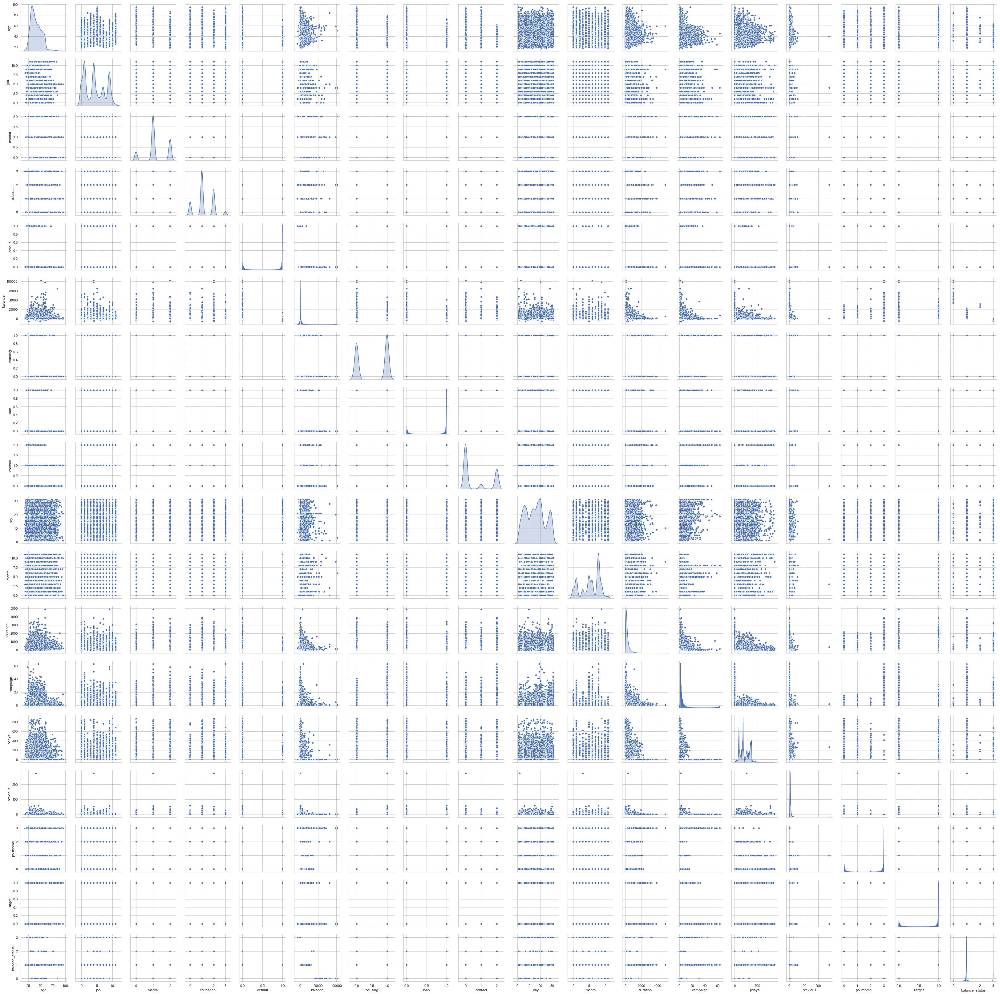

In [34]:
sns.pairplot(encoded_bank,diag_kind='kde')

In [35]:
#Correlation with output variable
corr = encoded_bank.corr()
bank_target = abs(corr["Target"])
bank_target

age               0.025155
job               0.040438
marital           0.045588
education         0.066241
default           0.022419
balance           0.052838
housing           0.139173
loan              0.068185
contact           0.148395
day               0.028348
month             0.024471
duration          0.394521
campaign          0.073172
pdays             0.103621
previous          0.093236
poutcome          0.077840
Target            1.000000
balance_status    0.057376
Name: Target, dtype: float64

## Target column: TARGET distribution anaylsis.
#### Data is having a huge bias (almost 1:11) towards the category of people not subscribed to Term Deposit.Hence we can form opinion that our model will tend to perform better towards predicting which customers wont subscrib to Term Deposit.However, our problem is to identify the customers that can accept Term Deposit based on the selected available features. Unfair !!!

In [36]:
## Calculate INDEPENDENT variable ratio of True/False from outcome variable

n_true = len(encoded_bank.loc[encoded_bank['Target'] == True])
n_false = len(encoded_bank.loc[encoded_bank['Target'] == False])
print("No. of clients subscribed a term deposit: {0} ({1:2.2f}%)".format(n_true, (n_true / (n_true + n_false)) * 100 ))
print("No. of clients NOT subscribed a term deposit: {0} ({1:2.2f}%)".format(n_false, (n_false / (n_true + n_false)) * 100))


No. of clients subscribed a term deposit: 5289 (11.70%)
No. of clients NOT subscribed a term deposit: 39922 (88.30%)


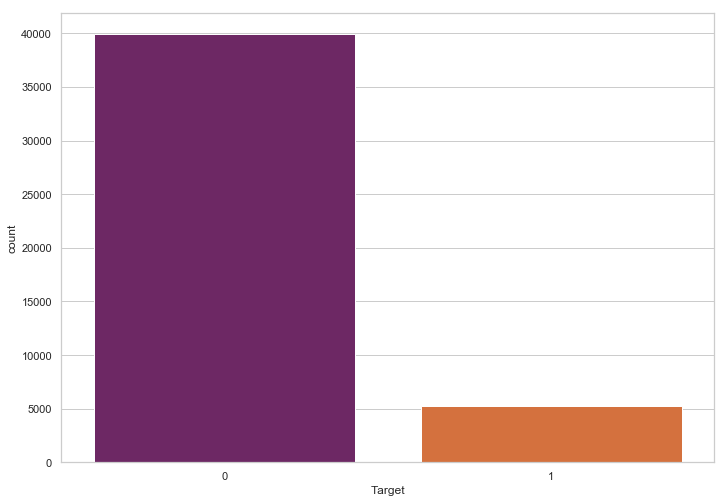

In [37]:
sns.countplot("Target",data=encoded_bank,palette='inferno')

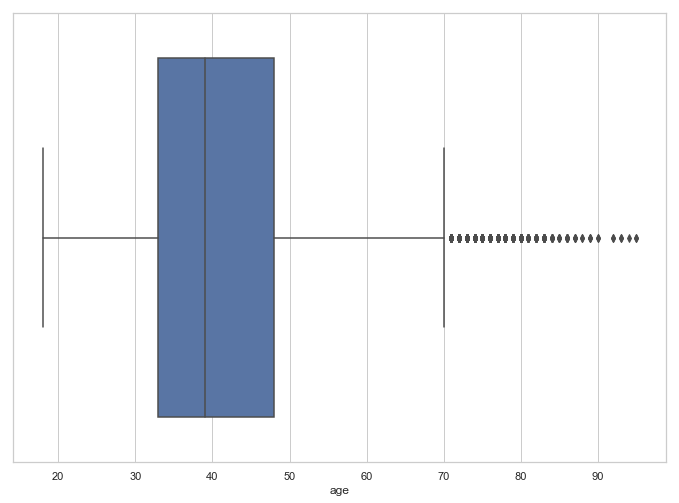

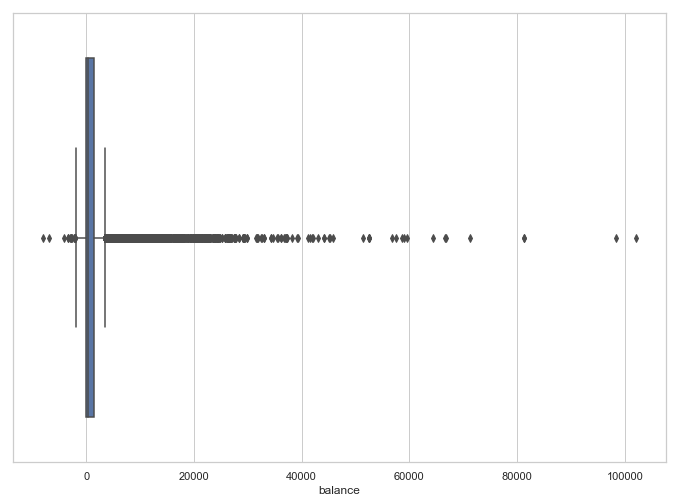

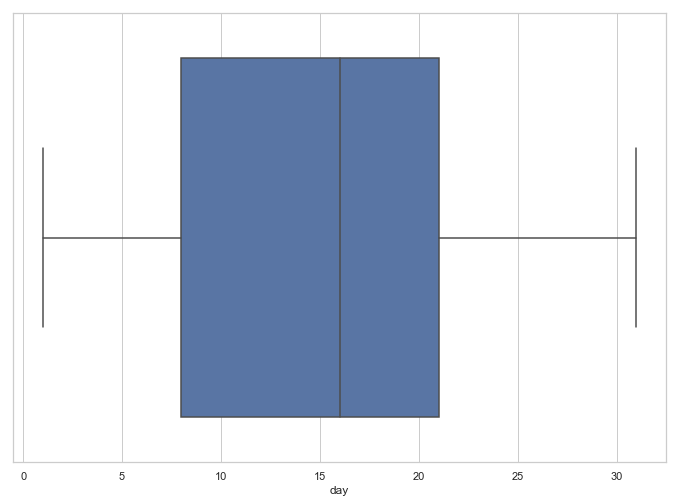

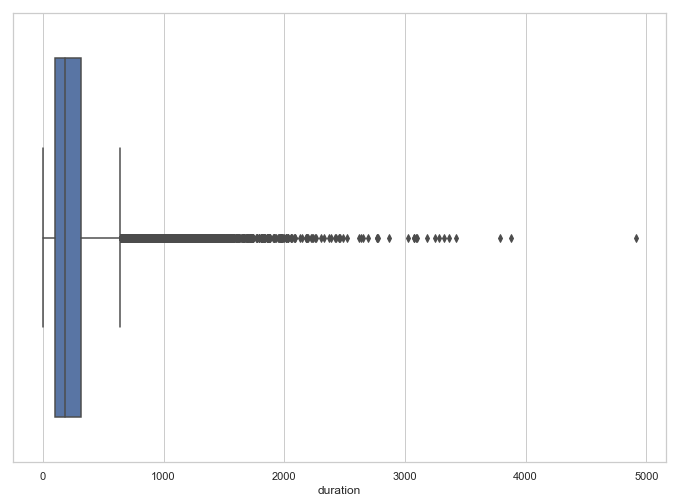

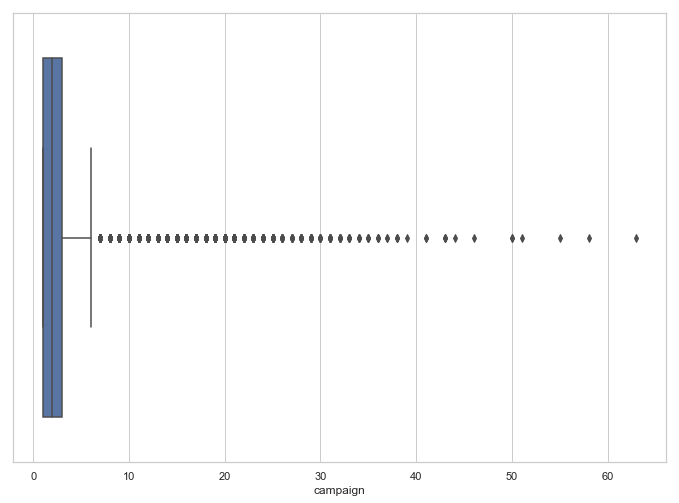

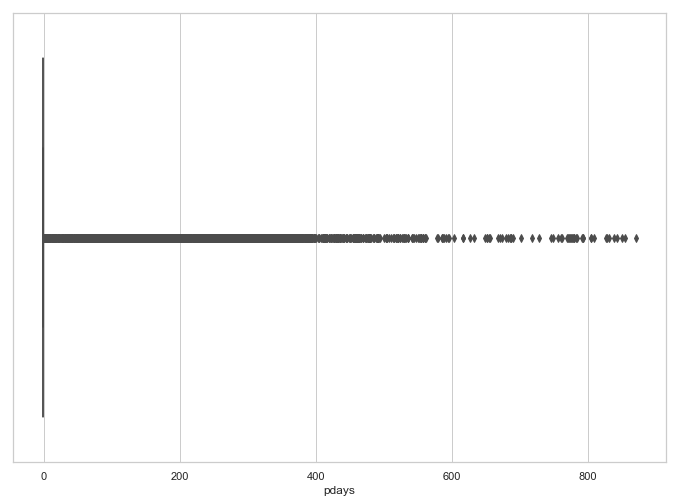

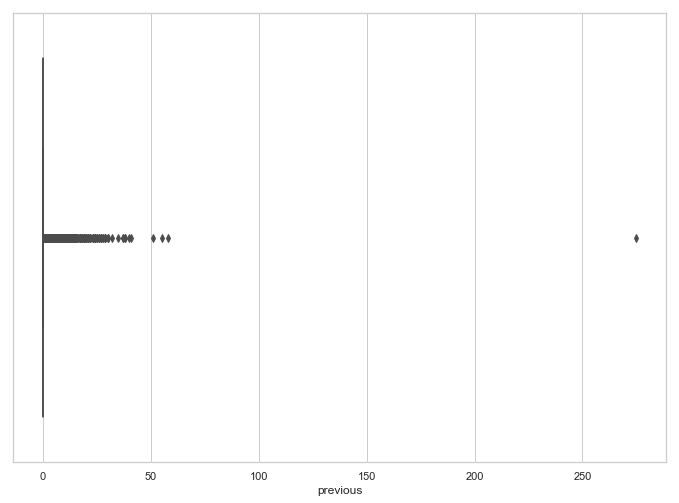

In [54]:
# Checking the presence of outliers
# Except AGE all numerical cols have huge % of outliers.

sns.boxplot(encoded_bank.age)
plt.show()
sns.boxplot(encoded_bank.balance)
plt.show()
sns.boxplot(encoded_bank.day)
plt.show()
sns.boxplot(encoded_bank.duration)
plt.show()
sns.boxplot(encoded_bank.campaign)
plt.show()
sns.boxplot(encoded_bank.pdays)
plt.show()
sns.boxplot(encoded_bank.previous)
plt.show()

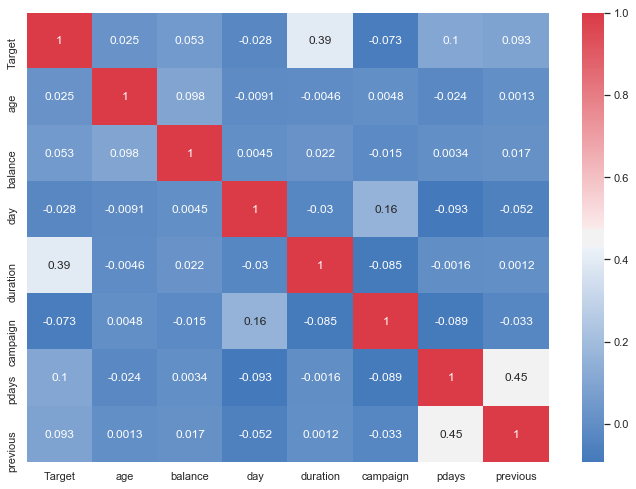

In [39]:
quant_df = encoded_bank[['Target','age','balance','day','duration','campaign','pdays','previous']].copy()
cmap = sns.diverging_palette(250, 10, as_cmap=True)
sns.heatmap(quant_df.corr(), cmap = cmap, annot = True);

In [40]:
quant_df.corr()['Target'][1:]

age         0.025155
balance     0.052838
day        -0.028348
duration    0.394521
campaign   -0.073172
pdays       0.103621
previous    0.093236
Name: Target, dtype: float64

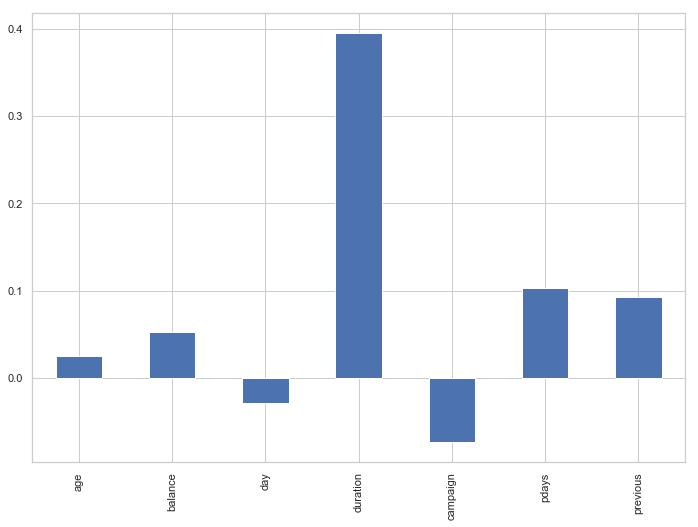

In [41]:
quant_df.corr()['Target'][1:].plot.bar();

### Insight Conclusion on Bank data :
1) Months of Marketing Activity: We saw that the the month of highest level of marketing activity was the month of May. However, this was the month that potential clients tended to reject term deposits offers (Lowest effective rate: -34.49%). 

2) Campaign Calls: A policy should be implemented that states that no more than 3 calls should be applied to the same potential client in order to save time and effort in getting new potential clients. Remember, the more we call the same potential client, the likely he or she will decline to open a term deposit.

3) Age Category: The next marketing campaign of the bank should target potential clients in their 20s or younger and 60s or older. The youngest category had a 60% chance of suscribing to a term deposit while the eldest category had a 76% chance of suscribing to a term deposit.

4) Occupation: Not surprisingly, potential clients that were students or retired were the most likely to suscribe to a term deposit. Retired individuals, tend to have more term deposits in order to gain some cash through interest payments. 

5) House Loans and Balances: Potential clients in the low balance and no balance category were more likely to have a house loan than people in the average and high balance category. This means that the potential client has financial compromises to pay back its house loan and thus, there is no cash for he or she to suscribe to a term deposit account. 

### Lets move on to make models for this data & to compute possiblities wether customers will subscrive to Term Deposit or not in the near future

### X ==> Independent Columns
### y ==> Depenedent Column (Target)

## Split data into ratio of 70:30 (training:testing) set
To check the effect of scaling on the dataset, let us create another set of data with scaling function applied to it.

#### X_train, X_test, y_train, y_test ==> Unscaled Split

#### ZX_train, ZX_test, y_train, y_test ==> Scaled Split

In [42]:
X=encoded_bank.drop(['Target'],axis=1)
y=encoded_bank['Target']
print(X.columns)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

ZX =stats.zscore(X)
ZX_train, ZX_test, y_train, y_test = train_test_split(ZX, y, test_size=0.3, random_state=10)

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'balance_status'],
      dtype='object')


### Standard CLASSIFICTION algorithms MODEL BUILDING - LOGISTIC REGRESSION, NAIVE BAYES, KNN & SVC

Models : LOGISTIC REGRESSION, NAIVE BAYES, KNN & SVC are being build & predicted on 2 parameters :

1) Non-scaler (X) ==> non-scaled INDEPENDENT cols

2) Scaler (ZX) ==> scaled INDEPENDENT cols



##  Non-scaler columns ###
The coefficient for age is 0.0042853921124325345
The coefficient for job is 0.0037374963471291703
The coefficient for marital is 0.18388754745142627
The coefficient for education is 0.17358650719803032
The coefficient for default is -0.03912843447732172
The coefficient for balance is 1.6092507260237342e-05
The coefficient for housing is -1.072726506299403
The coefficient for loan is -0.6655110186328701
The coefficient for contact is -0.6710014049308993
The coefficient for day is -0.008144374413945579
The coefficient for month is 0.03761174652371003
The coefficient for duration is 0.003944755924004181
The coefficient for campaign is -0.13344968405558513
The coefficient for pdays is 0.003096705866586133
The coefficient for previous is 0.10697117758504562
The coefficient for poutcome is 0.20012957545001855
The coefficient for balance_status is -0.27733943565801206

The intercept for our model is -3.319077806716522

##  Scaler columns ###
The coefficient for age

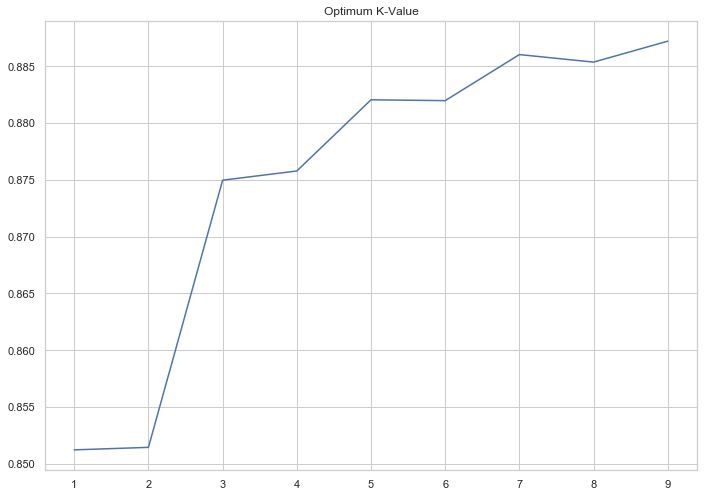

+++++++++++++++++++++++++++++++++++
KNN || SCALED Classification Report
+++++++++++++++++++++++++++++++++++
              precision    recall  f1-score   support

           0       0.91      0.98      0.94     12006
           1       0.61      0.29      0.40      1558

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.76      0.63      0.67     13564
weighted avg       0.88      0.90      0.88     13564


+++++++++++++++++++++++++++++++++++++++++
KNN || Non-SCALED Classification Report
+++++++++++++++++++++++++++++++++++++++++
              precision    recall  f1-score   support

           0       0.91      0.97      0.94     12006
           1       0.52      0.27      0.35      1558

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.71      0.62      0.65     13564
weighted avg       0.87      0.89      0.87     13564


+++++++++++++++++++++++++++++++++++
SVM || SCALED Classification Report
+++++++++++++++++++++++++++++++++++
    

In [43]:
## Logistic Regression on non-scaler cols

logRegA = LogisticRegression(solver='liblinear')
logRegA.fit(X_train,y_train)
y_test1A_predict = logRegA.predict(X_test)

## Logistic Regression on scaler cols

logRegB = LogisticRegression(solver='liblinear')
logRegB.fit(ZX_train,y_train)
y_test1B_predict = logRegB.predict(ZX_test)

model1A_score=metrics.accuracy_score(y_test, y_test1A_predict)
model1B_score=metrics.accuracy_score(y_test, y_test1B_predict)

#Calculate the coefficients of logistic regression model (non-scaler)
t = list(X_train.columns)
coef_df = pd.DataFrame(logRegA.coef_, columns= t)
coef_df['intercept'] = logRegA.intercept_

print()
print('##  Non-scaler columns ###')
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, logRegA.coef_[0][idx]))
print()
print("The intercept for our model is {}".format(logRegA.intercept_[0]))

print()
print('##  Scaler columns ###')
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, logRegB.coef_[0][idx]))
print()
print("The intercept for our model is {}".format(logRegB.intercept_[0]))
print()
print()

cm = metrics.confusion_matrix(y_test,y_test1B_predict)
cf = metrics.classification_report(y_test,y_test1B_predict)
print('++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(' LOGISTIC REGRESSION || SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(cf)


cf = metrics.classification_report(y_test,y_test1B_predict)
print()
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('LOGISTIC REGRESSION || Non-SCALED Classification Report')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test,y_test1A_predict))


print(cm)

#+++++++++++++++++++++++++++++++++
# Naive Bayes Classification
#+++++++++++++++++++++++++++++++++

gauss_modelA = GaussianNB()
gauss_modelA.fit(X_train, y_train)
y_test2A_predict = gauss_modelA.predict(X_test)

gauss_modelB = GaussianNB()
gauss_modelB.fit(ZX_train, y_train)
y_test2B_predict = gauss_modelB.predict(ZX_test)

model2A_score=metrics.accuracy_score(y_test, y_test2A_predict)
model2B_score=metrics.accuracy_score(y_test, y_test2B_predict)

print()
print(metrics.confusion_matrix(y_test, y_test2B_predict))
print('+++++++++++++++++++++++++++++++++++++++++++')
print('Naive Bayes || SCALED Classification Report')
print('++++++++++++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test, y_test2B_predict))


print()
print('+++++++++++++++++++++++++++++++++++++++++++++++')
print('Naive Bayes || Non-SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test,y_test2A_predict))

#===========================
#KNN
#===========================
scores=[]
for k in range(1,10):
 NNH = KNeighborsClassifier(n_neighbors= k , weights = 'distance' )
 NNH.fit(X_train, y_train)
 scores.append(NNH.score(X_test, y_test))
plt.plot(range(1,10),scores)
plt.title('Optimum K-Value')
plt.show()

## k=9 seems to be the best fit

NNHA = KNeighborsClassifier(n_neighbors=9 , weights = 'distance' )
NNHA.fit(X_train, y_train)
y_test3A_predict = NNHA.predict(X_test)

NNHB = KNeighborsClassifier(n_neighbors=9 , weights = 'distance' )
NNHB.fit(ZX_train, y_train)
y_test3B_predict = NNHB.predict(ZX_test)

model3A_score=metrics.accuracy_score(y_test, y_test3A_predict)
model3B_score=metrics.accuracy_score(y_test, y_test3B_predict)

print('+++++++++++++++++++++++++++++++++++')
print('KNN || SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test, y_test3B_predict))


print()
print('+++++++++++++++++++++++++++++++++++++++++')
print('KNN || Non-SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test,y_test3A_predict))

print()

#===========================
#Support Vector Machine
#===========================

clfA = svm.SVC(gamma=0.025, C=3)    
clfA.fit(X_train , y_train)
y_test4A_predict = clfA.predict(X_test)
model4A_score=metrics.accuracy_score(y_test , y_test1A_predict)

clfB = svm.SVC(gamma=0.025, C=3)    
clfB.fit(ZX_train , y_train)
y_test4B_predict = clfB.predict(ZX_test)
model4B_score=metrics.accuracy_score(y_test , y_test1B_predict)

print('+++++++++++++++++++++++++++++++++++')
print('SVM || SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test, y_test4B_predict))

print()
print('+++++++++++++++++++++++++++++++++++++++')
print('SVM || Non-SCALED Classification Report')
print('+++++++++++++++++++++++++++++++++++++++')
print(metrics.classification_report(y_test,y_test4A_predict))


# COMPARISON OF MODELS : ROC & AUC plots

Overall Model Accuracy before scaling:
{'Logistic Regression': 0.8929519315836036, 'Naive Bayes': 0.8346358006487762, 'K-Nearest Neighbors': 0.8872014155116484, 'SVM': 0.8929519315836036}


Overall Model Accuracy After scaling:
{'Logistic Regression': 0.893246829843704, 'Naive Bayes': 0.8280743143615452, 'K-Nearest Neighbors': 0.8969330580949573, 'SVM': 0.893246829843704}


AUC Scores (non-scaler): Linear Regression:  0.60 , Naive Bayes: 0.69  ,KNN: 0.62 , SVM: 0.50
AUC Scores (scaler): Linear Regression:  0.60 , Naive Bayes: 0.70  ,KNN: 0.63 , SVM: 0.63


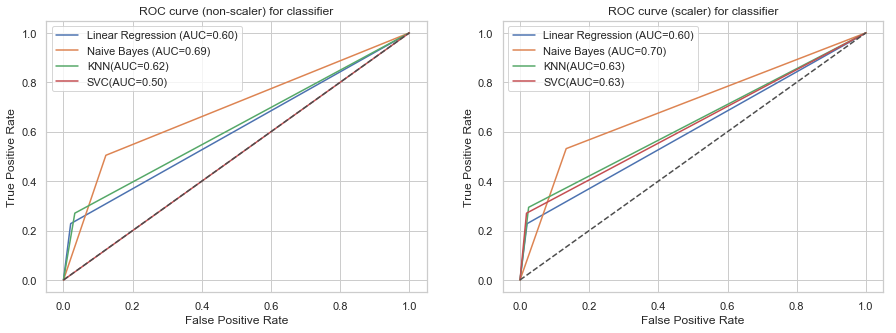

In [44]:
#+++++++++++++++++++++++++++++++++
##  PLOT ROC
#+++++++++++++++++++++++++++++++++
# show ROC curve


auc1A = roc_auc_score(y_test, y_test1A_predict)
auc2A = roc_auc_score(y_test, y_test2A_predict)
auc3A = roc_auc_score(y_test, y_test3A_predict)
auc4A = roc_auc_score(y_test, y_test4A_predict)


auc1B = roc_auc_score(y_test, y_test1B_predict)
auc2B = roc_auc_score(y_test, y_test2B_predict)
auc3B = roc_auc_score(y_test, y_test3B_predict)
auc4B = roc_auc_score(y_test, y_test4B_predict)

Accuracy_Before_Scaling = {'Logistic Regression': model1A_score, 'Naive Bayes': model2A_score, 
                           'K-Nearest Neighbors': model3A_score, 'SVM': model4A_score}
Accuracy_After_Scaling = {'Logistic Regression': model1B_score, 'Naive Bayes': model2B_score, 
                          'K-Nearest Neighbors': model3B_score, 'SVM': model4B_score}

print('Overall Model Accuracy before scaling:')
print (Accuracy_Before_Scaling)
print('\n')
print('Overall Model Accuracy After scaling:')
print (Accuracy_After_Scaling)

print()
print()
print('AUC Scores (non-scaler): Linear Regression:  %.2f' %auc1A,', Naive Bayes: %.2f' %auc2A,' ,KNN: %.2f' %auc3A,', SVM: %.2f' %auc4A)
print('AUC Scores (scaler): Linear Regression:  %.2f' %auc1B,', Naive Bayes: %.2f' %auc2B,' ,KNN: %.2f' %auc3B,', SVM: %.2f' %auc4B)


fpr1A, tpr1A, thresholds1A = roc_curve(y_test, y_test1A_predict)
fpr2A, tpr2A, thresholds2A = roc_curve(y_test, y_test2A_predict)
fpr3A, tpr3A, thresholds3A = roc_curve(y_test, y_test3A_predict)
fpr4A, tpr4A, thresholds4A = roc_curve(y_test, y_test4A_predict)

fpr1B, tpr1B, thresholds1B = roc_curve(y_test, y_test1B_predict)
fpr2B, tpr2B, thresholds2B = roc_curve(y_test, y_test2B_predict)
fpr3B, tpr3B, thresholds3B = roc_curve(y_test, y_test3B_predict)
fpr4B, tpr4B, thresholds4B = roc_curve(y_test, y_test4B_predict)

fig, ax = plt.subplots(1,2, figsize = (15,5))
##sns.violinplot(quant_df["Personal Loan"],quant_df["Age"],ax=axes[0,0])

## AUC curve -- non-scaler
#fig, ax = plt.subplots()
#ax.subplot(1,0)
ax[0].plot(fpr1A, tpr1A,label='Linear Regression (AUC=%.2f)'%auc1A)
ax[0].plot(fpr2A, tpr2A,label='Naive Bayes (AUC=%.2f)'%auc2A)
ax[0].plot(fpr3A, tpr3A,label='KNN(AUC=%.2f)'%auc3A) 
ax[0].plot(fpr4A, tpr4A,label='SVC(AUC=%.2f)'%auc4A) 
ax[0].plot([0, 1], [0, 1],ls="--", c=".3")
ax[0].set_title('ROC curve (non-scaler) for classifier', fontweight = 30)
ax[0].set_xlabel('False Positive Rate')
ax[0].set_ylabel('True Positive Rate')
ax[0].legend()

## AUC curve -- Scaler
ax[1].plot(fpr1B, tpr1B,label='Linear Regression (AUC=%.2f)'%auc1B)
ax[1].plot(fpr2B, tpr2B,label='Naive Bayes (AUC=%.2f)'%auc2B)
ax[1].plot(fpr3B, tpr3B,label='KNN(AUC=%.2f)'%auc3B) 
ax[1].plot(fpr4B, tpr4B,label='SVC(AUC=%.2f)'%auc4B) 
ax[1].plot([0, 1], [0, 1], ls="--", c=".3")
ax[1].set_title('ROC curve (scaler) for classifier', fontweight = 30)
ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[1].legend()


In [45]:
LinRegg_Gini=2*auc1A - 1
NavBay_Gini=2*auc2A - 1
KNN_Gini=2*auc3A - 1
SVC_Gini=2*auc4A - 1

LinRegg_Gini_S=2*auc1B - 1
NavBay_Gini_S=2*auc2B - 1
KNN_Gini_S=2*auc3B - 1
SVC_Gini_S=2*auc4B - 1

Compare1 = [[model1A_score,LinRegg_Gini,auc1A],
           [model2A_score,NavBay_Gini,auc2A],
           [model3A_score,KNN_Gini,auc3A],
           [model4A_score,SVC_Gini,auc4A],
           [model1B_score,LinRegg_Gini_S,auc1B],
           [model2B_score,NavBay_Gini_S,auc2B],
           [model3B_score,KNN_Gini_S,auc3B],
           [model4B_score,SVC_Gini_S,auc4B],
          ]


Compare1A = [[model1B_score,LinRegg_Gini_S,auc1B],
           [model2B_score,NavBay_Gini_S,auc2B],
           [model3B_score,KNN_Gini_S,auc3B],
           [model4B_score,SVC_Gini_S,auc4B],
          ]

Compare1B = [[model1A_score,LinRegg_Gini,auc1A],
           [model2A_score,NavBay_Gini,auc2A],
           [model3A_score,KNN_Gini,auc3A],
           [model4A_score,SVC_Gini,auc4A],
           ]


print('++++++++++++++++++++++++++++++++++')
print('         Model Comparison         ')
print('++++++++++++++++++++++++++++++++++')
Compare1_Models = pd.DataFrame(Compare1, columns= ['Accuracy','Gini Index', 'AUC'], 
                                  index=['Logistic','Naive','KNN','SVC',
                                         'Logistic_Scaled','Naive_Scaled','KNN_Scaled','SVC_Scaled'])
Compare1_Models


++++++++++++++++++++++++++++++++++
         Model Comparison         
++++++++++++++++++++++++++++++++++


,Accuracy,Gini Index,AUC
Logistic,0.892952,0.207117,0.603558
Naive,0.834636,0.381971,0.690985
KNN,0.887201,0.237485,0.618742
SVC,0.892952,-0.000416,0.499792
Logistic_Scaled,0.893247,0.207450,0.603725
Naive_Scaled,0.828074,0.398017,0.699009
KNN_Scaled,0.896933,0.269146,0.634573
SVC_Scaled,0.893247,0.251478,0.625739


### Logistic, KNN & SVC have ~89% accuracy whereas Naive Bayes has achieved max. Ginni Index of 39.8%

# Ensemble Techniques

### Models : Adaboost, Stochastic Gradient,Bagged Decision Trees & Random Forest are being build & predicted on 4 parameters :

#### TestTrain Split method
1) Non-scaler (X) ==> non-scaled INDEPENDENT cols

2) Scaler (ZX) ==> scaled INDEPENDENT cols

#### StratifiedKFold split method
1) Non-scaler (X) ==> non-scaled INDEPENDENT cols

2) Scaler (ZX) ==> scaled INDEPENDENT cols

#### Therefore every Ensemble model will predict 4 results

[0.88543625 0.85447307 0.86098208 0.71776156 0.68775578]
0.8012817484286021
[0.88543625 0.85447307 0.86098208 0.71776156 0.68775578]
0.8012817484286021


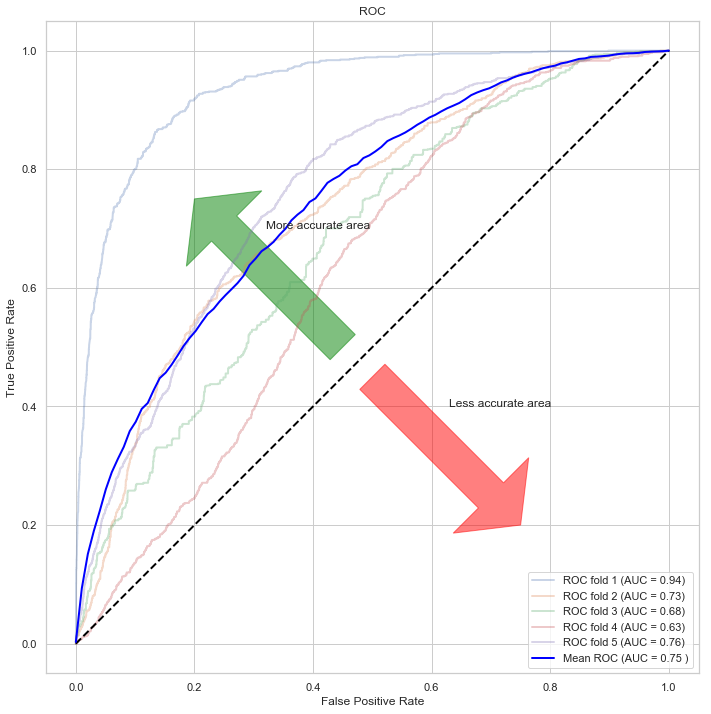

AdaBoost Accuracy (non-scaler) (train_test_split) : 0.8980389265703332
AdaBoost Accuracy (scaler) (train_test_split) : 0.8980389265703332
AdaBoost Accuracy (non-scaler) (StratifiedKFold): 0.8012817484286021
AdaBoost Accuracy (scaler) (StratifiedKFold): 0.8012817484286021
AdaBoost Accuracy Overall ROC score: 0.7479427332565632


In [46]:
## BOOSTING ####
#=======================
#AdaBoost
#=======================
# Train-Test 70-30 spilt

adaBoost1A = AdaBoostClassifier(n_estimators=50,learning_rate=1)
adaModel1A = adaBoost1A.fit(X_train, y_train)
y_pred1A = adaModel1A.predict(X_test)

adaBoost1B = AdaBoostClassifier(n_estimators=50,learning_rate=1)
adaModelB = adaBoost1B.fit(ZX_train, y_train)
y_pred1B = adaModelB.predict(ZX_test)


## StratifiedKFold

#random_state = np.random.RandomState(0)
skf = StratifiedKFold(n_splits=5,shuffle=False,random_state=10)
clf =AdaBoostClassifier(n_estimators=50,learning_rate=1)
result1C = model_selection.cross_val_score(clf, X, y, cv=skf)
print(result1C)
print(result1C.mean())

#random_state = np.random.RandomState(10)
skf1 = StratifiedKFold(n_splits=5,shuffle=False)
clf1 =AdaBoostClassifier(n_estimators=50,learning_rate=1)
result1D = model_selection.cross_val_score(clf1, ZX, y, cv=skf)
print(result1D)
print(result1D.mean())

# plot ROC
fig1 = plt.figure(figsize=[12,12])
ax1 = fig1.add_subplot(111,aspect = 'equal')
ax1.add_patch(
    patches.Arrow(0.45,0.5,-0.25,0.25,width=0.3,color='green',alpha = 0.5)
    )
ax1.add_patch(
    patches.Arrow(0.5,0.45,0.25,-0.25,width=0.3,color='red',alpha = 0.5)
    )

tprs = []
aucs = []
mean_fpr = np.linspace(0,1,100)
i = 1
for train,test in skf.split(X,y):
    prediction = clf.fit(X.iloc[train],y.iloc[train]).predict_proba(X.iloc[test])
    fpr, tpr, t = roc_curve(y[test], prediction[:, 1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i= i+1

plt.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue',
         label=r'Mean ROC (AUC = %0.2f )' % (mean_auc),lw=2, alpha=1)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.text(0.32,0.7,'More accurate area',fontsize = 12)
plt.text(0.63,0.4,'Less accurate area',fontsize = 12)
plt.show()

print("AdaBoost Accuracy (non-scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred1A))
print("AdaBoost Accuracy (scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred1B))
print("AdaBoost Accuracy (non-scaler) (StratifiedKFold):",result1C.mean())
print("AdaBoost Accuracy (scaler) (StratifiedKFold):",result1D.mean())
print("AdaBoost Accuracy Overall ROC score:",mean_auc)

ada11=metrics.accuracy_score(y_test, y_pred1A)
ada12=metrics.accuracy_score(y_test, y_pred1B)
ada13=result1C.mean()
ada14=result1D.mean()
ada15=mean_auc
ada16=(2*ada15)-1



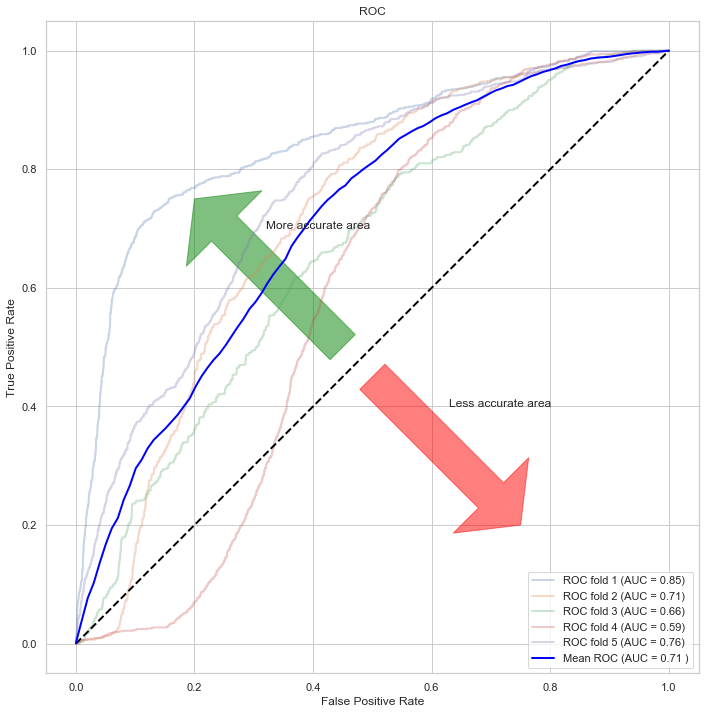

Stochastic Gradient Accuracy (non-scaler) (train_test_split) : 0.9062960778531407
Stochastic Gradient Accuracy (scaler) (train_test_split) : 0.9061486287230905
Stochastic Gradient Accuracy (non-scaler) (StratifiedKFold): 0.7757351666225849
Stochastic Gradient Accuracy (scaler) (StratifiedKFold): 0.7757351666225849
Stochastic Gradient Accuracy Overall ROC score: 0.7119754268278772


In [47]:
## BOOSTING ####
#=======================
#Stochastic Gradient
#=======================
# Train-Test 70-30 spilt


gradBoost2A = GradientBoostingClassifier(n_estimators=50,learning_rate=1)
gradModel2A = gradBoost2A.fit(X_train, y_train)
y_pred2A = gradModel2A.predict(X_test)

gradBoost2B = GradientBoostingClassifier(n_estimators=50,learning_rate=1)
gradModel2B = gradBoost2A.fit(ZX_train, y_train)
y_pred2B = gradModel2B.predict(ZX_test)

skfg = StratifiedKFold(n_splits=5,shuffle=False)
model = GradientBoostingClassifier(n_estimators=50, random_state=10)
result2C = model_selection.cross_val_score(model, X, y, cv=skfg)

kfold = model_selection.KFold(n_splits=10, random_state=10)
skfg = StratifiedKFold(n_splits=5,shuffle=False)
model = GradientBoostingClassifier(n_estimators=50, random_state=10)
result2D = model_selection.cross_val_score(model, ZX, y, cv=skfg)

# plot ROC
fig1 = plt.figure(figsize=[12,12])
ax1 = fig1.add_subplot(111,aspect = 'equal')
ax1.add_patch(
    patches.Arrow(0.45,0.5,-0.25,0.25,width=0.3,color='green',alpha = 0.5)
    )
ax1.add_patch(
    patches.Arrow(0.5,0.45,0.25,-0.25,width=0.3,color='red',alpha = 0.5)
    )

tprs = []
aucs = []
mean_fpr = np.linspace(0,1,100)
i = 1
for train,test in skfg.split(X,y):
    prediction = model.fit(X.iloc[train],y.iloc[train]).predict_proba(X.iloc[test])
    fpr, tpr, t = roc_curve(y[test], prediction[:, 1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i= i+1

plt.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue',
         label=r'Mean ROC (AUC = %0.2f )' % (mean_auc),lw=2, alpha=1)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.text(0.32,0.7,'More accurate area',fontsize = 12)
plt.text(0.63,0.4,'Less accurate area',fontsize = 12)
plt.show()

print("Stochastic Gradient Accuracy (non-scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred2A))
print("Stochastic Gradient Accuracy (scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred2B))
print("Stochastic Gradient Accuracy (non-scaler) (StratifiedKFold):",result2C.mean())
print("Stochastic Gradient Accuracy (scaler) (StratifiedKFold):",result2D.mean())
print("Stochastic Gradient Accuracy Overall ROC score:",mean_auc)


grad21=metrics.accuracy_score(y_test, y_pred2A)
grad22=metrics.accuracy_score(y_test, y_pred2B)
grad23=result2C.mean()
grad24=result2D.mean()
grad25=mean_auc
grad26=(2*grad25)-1


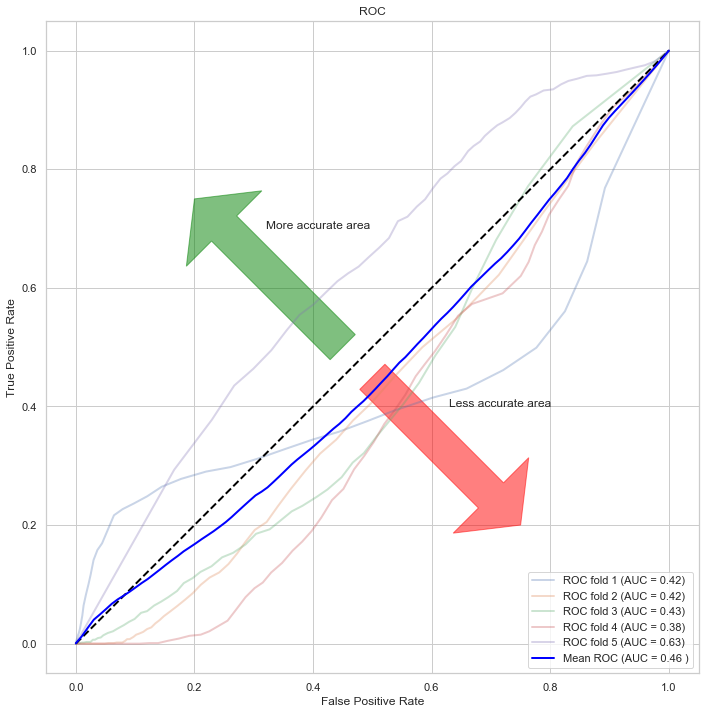

Bagged Decision Trees Accuracy (non-scaler) (train_test_split) : 0.9084340902388676
Bagged Decision Trees Accuracy (scaler) (train_test_split) : 0.9085078148038926
Bagged Decision Trees Accuracy (non-scaler) (StratifiedKFold): 0.6530361447459964
Bagged Decision Trees Accuracy (scaler) (StratifiedKFold): 0.6533679346461446
Bagged Decision Trees Accuracy Overall ROC score: 0.4565504843353493


In [48]:
#Bagged Decision Trees

cart = DecisionTreeClassifier()
baggDT3A = BaggingClassifier(base_estimator=cart, n_estimators=50, random_state=10)
baggModel3A = baggDT3A.fit(X_train, y_train)
y_pred3A = baggModel3A.predict(X_test)

baggDT3B = BaggingClassifier(base_estimator=cart, n_estimators=50, random_state=10)
baggModel3B = baggDT3B.fit(ZX_train, y_train)
y_pred3B = baggModel3B.predict(ZX_test)

skfg = StratifiedKFold(n_splits=5,shuffle=False)
model = BaggingClassifier(base_estimator=cart, n_estimators=50, random_state=10)
result3C = model_selection.cross_val_score(model, X, y, cv=skfg)

skfg = StratifiedKFold(n_splits=5,shuffle=False)
model = BaggingClassifier(base_estimator=cart, n_estimators=50, random_state=10)
result3D = model_selection.cross_val_score(model, ZX, y, cv=skfg)

# plot ROC
fig1 = plt.figure(figsize=[12,12])
ax1 = fig1.add_subplot(111,aspect = 'equal')
ax1.add_patch(
    patches.Arrow(0.45,0.5,-0.25,0.25,width=0.3,color='green',alpha = 0.5)
    )
ax1.add_patch(
    patches.Arrow(0.5,0.45,0.25,-0.25,width=0.3,color='red',alpha = 0.5)
    )

tprs = []
aucs = []
mean_fpr = np.linspace(0,1,100)
i = 1
for train,test in skfg.split(X,y):
    prediction = model.fit(X.iloc[train],y.iloc[train]).predict_proba(X.iloc[test])
    fpr, tpr, t = roc_curve(y[test], prediction[:, 1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i= i+1

plt.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue',
         label=r'Mean ROC (AUC = %0.2f )' % (mean_auc),lw=2, alpha=1)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.text(0.32,0.7,'More accurate area',fontsize = 12)
plt.text(0.63,0.4,'Less accurate area',fontsize = 12)
plt.show()

print("Bagged Decision Trees Accuracy (non-scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred3A))
print("Bagged Decision Trees Accuracy (scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred3B))
print("Bagged Decision Trees Accuracy (non-scaler) (StratifiedKFold):",result3C.mean())
print("Bagged Decision Trees Accuracy (scaler) (StratifiedKFold):",result3D.mean())
print("Bagged Decision Trees Accuracy Overall ROC score:",mean_auc)

bagg31=metrics.accuracy_score(y_test, y_pred3A)
bagg32=metrics.accuracy_score(y_test, y_pred3B)
bagg33=result3C.mean()
bagg34=result3D.mean()
bagg35=mean_auc
bagg36=(2*bagg35)-1

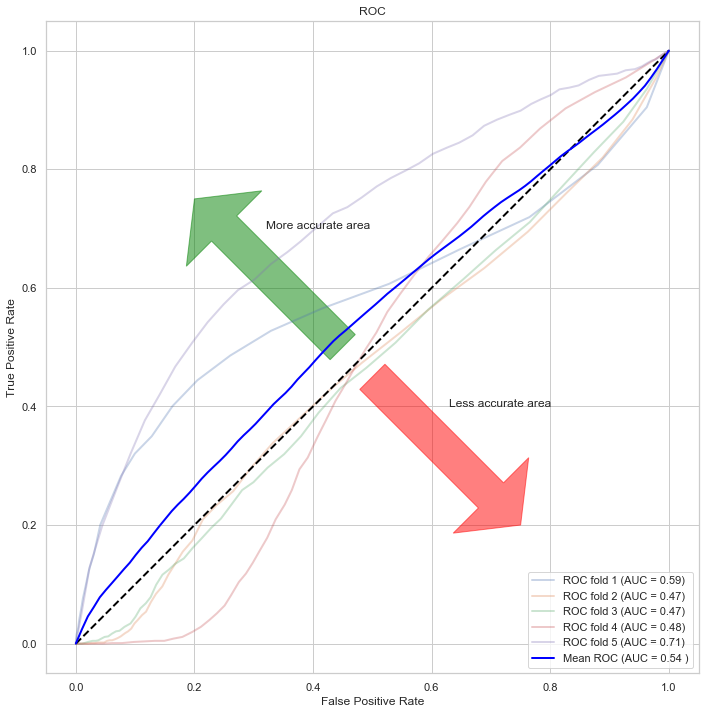

Random Forest Accuracy (non-scaler) (train_test_split) : 0.9071807726334414
Random Forest Trees Accuracy (scaler) (train_test_split) : 0.9071070480684164
Random Forest Trees Accuracy (non-scaler) (StratifiedKFold): 0.7023177398596957
Random Forest Trees Accuracy (scaler) (StratifiedKFold): 0.7020967993702042
Random Forest Trees Accuracy Overall ROC score: 0.5401066036807454
date and time = 15/12/2019 16:32:07


In [49]:

## Random Forest

randFrst4A = RandomForestClassifier(n_estimators=50)
randModel4A = randFrst4A.fit(X_train, y_train)
y_pred4A = randModel4A.predict(X_test)

randFrst4B = RandomForestClassifier(n_estimators=50)
randModel4B = randFrst4B.fit(ZX_train, y_train)
y_pred4B = randModel4B.predict(ZX_test)

skfg = StratifiedKFold(n_splits=5,shuffle=False)
model = RandomForestClassifier(n_estimators=50)
result4C = model_selection.cross_val_score(model, X, y, cv=skfg)

model = RandomForestClassifier(n_estimators=50)
result4D = model_selection.cross_val_score(model, ZX, y, cv=skfg)

# plot ROC
fig1 = plt.figure(figsize=[12,12])
ax1 = fig1.add_subplot(111,aspect = 'equal')
ax1.add_patch(
    patches.Arrow(0.45,0.5,-0.25,0.25,width=0.3,color='green',alpha = 0.5)
    )
ax1.add_patch(
    patches.Arrow(0.5,0.45,0.25,-0.25,width=0.3,color='red',alpha = 0.5)
    )

tprs = []
aucs = []
mean_fpr = np.linspace(0,1,100)
i = 1
for train,test in skfg.split(X,y):
    prediction = model.fit(X.iloc[train],y.iloc[train]).predict_proba(X.iloc[test])
    fpr, tpr, t = roc_curve(y[test], prediction[:, 1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i= i+1

plt.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
mean_tpr = np.mean(tprs, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='blue',
         label=r'Mean ROC (AUC = %0.2f )' % (mean_auc),lw=2, alpha=1)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.text(0.32,0.7,'More accurate area',fontsize = 12)
plt.text(0.63,0.4,'Less accurate area',fontsize = 12)
plt.show()

print("Random Forest Accuracy (non-scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred4A))
print("Random Forest Trees Accuracy (scaler) (train_test_split) :",metrics.accuracy_score(y_test, y_pred4B))
print("Random Forest Trees Accuracy (non-scaler) (StratifiedKFold):",result4C.mean())
print("Random Forest Trees Accuracy (scaler) (StratifiedKFold):",result4D.mean())
print("Random Forest Trees Accuracy Overall ROC score:",mean_auc)

rand41=metrics.accuracy_score(y_test, y_pred4A)
rand42=metrics.accuracy_score(y_test, y_pred4B)
rand43=result4C.mean()
rand44=result4D.mean()
rand45=mean_auc
rand46=(2*rand45)-1

now = datetime.now()
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("date and time =", dt_string)	

In [57]:
Compare = [[ada11,ada12,ada13,ada14,ada15,ada16],
           [grad21,grad22,grad23,grad24,grad25,grad26],
           [bagg31,bagg32,bagg33,bagg34,bagg35,bagg36],
           [rand41,rand42,rand43,rand44,rand45,rand46]
          ]

print('++++++++++++++++++++++++++++++++++')
print('    Ensemble Model Comparison     ')
print('++++++++++++++++++++++++++++++++++')
print('')
print('')

print('TTS Accuracy ==> TrainTestSplit Scaler')
print('TTNSA Accuracy ==> TrainTestSplit Non-Scaler')
print('StratifiedK-Fold Scaler Accuracy ==> KFSA')
print('StratifiedK-Fold Non-Scaler Accuracy ==> KFNSA')
print('')


Compare_Models = pd.DataFrame(Compare, columns= ['TTSA','TTNSA', 'KFSA','KFNSA','AUC','Gini'], 
                                  index=['Ada Boosting ','Stochastic Gradient','Bagged Decision Trees','Random Forest'])
print(Compare_Models)


++++++++++++++++++++++++++++++++++
    Ensemble Model Comparison     
++++++++++++++++++++++++++++++++++


TTS Accuracy ==> TrainTestSplit Scaler
TTNSA Accuracy ==> TrainTestSplit Non-Scaler
StratifiedK-Fold Scaler Accuracy ==> KFSA
StratifiedK-Fold Non-Scaler Accuracy ==> KFNSA

                           TTSA     TTNSA      KFSA     KFNSA       AUC  \
Ada Boosting           0.898039  0.898039  0.801282  0.801282  0.747943   
Stochastic Gradient    0.906296  0.906149  0.775735  0.775735  0.711975   
Bagged Decision Trees  0.908434  0.908508  0.653036  0.653368  0.456550   
Random Forest          0.907181  0.907107  0.702318  0.702097  0.540107   

                           Gini  
Ada Boosting           0.495885  
Stochastic Gradient    0.423951  
Bagged Decision Trees -0.086899  
Random Forest          0.080213  


#### There is not much difference on Accuracy scores wether Independent cols are Scaled or Not. 

#### TrainTest split method seems to be overfit here & has reported ~90% accuracy for all AdaBoost, Stocahastic Gradient, Bagged Descision Trees & Random forest models.

#### StratifiedK-Fold method has max Accuracy ~80% for AdaBoosting 

In [50]:
## Stacking
seed = 7
kfold = model_selection.KFold(n_splits=10, random_state=seed)
# create the sub models
estimators = []
model1 = LogisticRegression(solver='lbfgs')
estimators.append(('logistic', model1))
model2 = DecisionTreeClassifier()
estimators.append(('cart', model2))
model3 = SVC(gamma='auto')
estimators.append(('svm', model3))
# create the ensemble model
ensemble = VotingClassifier(estimators)

now = datetime.now()
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("Start : date and time =", dt_string)	

results = model_selection.cross_val_score(ensemble, X, y, cv=kfold)
print(results.mean())
now = datetime.now()
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("End : date and time =", dt_string)	

Start : date and time = 15/12/2019 16:32:07


C:\Users\Ah0183909\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.

C:\Users\Ah0183909\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.

C:\Users\Ah0183909\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.

C:\Users\Ah0183909\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.

C:\Users\Ah0183909\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.

C:\Users\Ah0183909\AppData\Local\Continu

0.8843403984022276
End : date and time = 15/12/2019 18:09:47


## Stacking Ensemble using  LogisticRegression, DecisionTree & Support Vector classifer has scored an Accuracy of ~88.4%

# Stiching time!!!! 
# Lets join all the pieces now.
# Performance comparison across all the BASE & ENSEMBLE Models !!!

++++++++++++++++++++++++++++++++++
    Base  Model Comparison        
++++++++++++++++++++++++++++++++++
                 Accuracy  Gini Index       AUC
Logistic         0.892952    0.207117  0.603558
Naive            0.834636    0.381971  0.690985
KNN              0.887201    0.237485  0.618742
SVC              0.892952   -0.000416  0.499792
Logistic_Scaled  0.893247    0.207450  0.603725
Naive_Scaled     0.828074    0.398017  0.699009
KNN_Scaled       0.896933    0.269146  0.634573
SVC_Scaled       0.893247    0.251478  0.625739


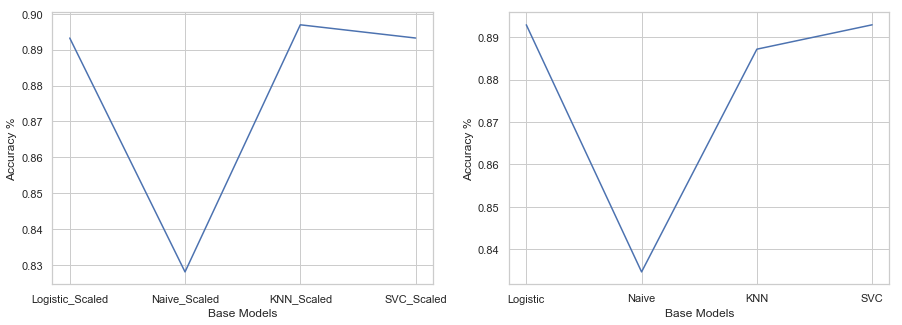

++++++++++++++++++++++++++++++++++
    Ensemble Model Comparison     
++++++++++++++++++++++++++++++++++


TTS Accuracy ==> TrainTestSplit Scaler
TTNSA Accuracy ==> TrainTestSplit Non-Scaler
K-Fold Scaler Accuracy ==> KFSA
K-Fold Non-Scaler Accuracy ==> KFNSA

                           TTSA     TTNSA      KFSA     KFNSA       AUC  \
Ada Boosting           0.898039  0.898039  0.801282  0.801282  0.747943   
Stochastic Gradient    0.906296  0.906149  0.775735  0.775735  0.711975   
Bagged Decision Trees  0.908434  0.908508  0.653036  0.653368  0.456550   
Random Forest          0.907181  0.907107  0.702318  0.702097  0.540107   

                           Gini  
Ada Boosting           0.495885  
Stochastic Gradient    0.423951  
Bagged Decision Trees -0.086899  
Random Forest          0.080213  


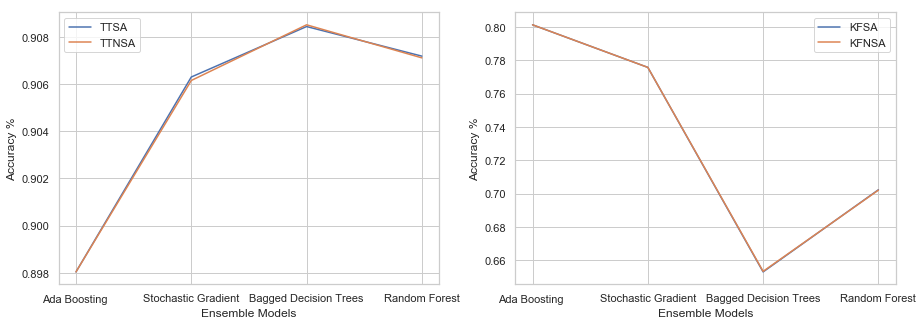

++++++++++++++++++++++++++++++++++
    Stacking Model Comparison     
++++++++++++++++++++++++++++++++++

Accracy Score : 0.8843403984022276
date and time = 15/12/2019 19:41:19


In [59]:
print('++++++++++++++++++++++++++++++++++')
print('    Base  Model Comparison        ')
print('++++++++++++++++++++++++++++++++++')
Compare1_Models = pd.DataFrame(Compare1, columns= ['Accuracy','Gini Index', 'AUC'], 
                                  index=['Logistic','Naive','KNN','SVC',
                                         'Logistic_Scaled','Naive_Scaled','KNN_Scaled','SVC_Scaled'])
print(Compare1_Models)

Compare1A = [[model1B_score],
           [model2B_score],
           [model3B_score],
           [model4B_score],
          ]

Compare1B = [[model1A_score],
           [model2A_score],
           [model3A_score],
           [model4A_score],
           ]


Compare1B_Models = pd.DataFrame(Compare1B, columns= ['Accuracy'], 
                                  index=['Logistic','Naive','KNN','SVC'])

Compare1A_Models = pd.DataFrame(Compare1A, columns= ['Accuracy'], 
                                  index=['Logistic_Scaled','Naive_Scaled','KNN_Scaled','SVC_Scaled'])

fig, ax = plt.subplots(1,2, figsize = (15,5))
ax[0].plot(Compare1A_Models.index.values, Compare1A_Models['Accuracy'])
ax[0].set_xlabel('Base Models')
ax[0].set_ylabel('Accuracy %')
##ax[0].legend()
ax[1].plot(Compare1B_Models.index.values, Compare1B_Models['Accuracy'])
ax[1].set_xlabel('Base Models')
ax[1].set_ylabel('Accuracy %')
##ax[0].legend()
plt.show()


Compare = [[ada11,ada12,ada13,ada14,ada15,ada16],
           [grad21,grad22,grad23,grad24,grad25,grad26],
           [bagg31,bagg32,bagg33,bagg34,bagg35,bagg36],
           [rand41,rand42,rand43,rand44,rand45,rand46]
          ]

print('++++++++++++++++++++++++++++++++++')
print('    Ensemble Model Comparison     ')
print('++++++++++++++++++++++++++++++++++')
print('')
print('')

print('TTS Accuracy ==> TrainTestSplit Scaler')
print('TTNSA Accuracy ==> TrainTestSplit Non-Scaler')
print('K-Fold Scaler Accuracy ==> KFSA')
print('K-Fold Non-Scaler Accuracy ==> KFNSA')
print('')


Compare_Models = pd.DataFrame(Compare, columns= ['TTSA','TTNSA', 'KFSA','KFNSA','AUC','Gini'], 
                                  index=['Ada Boosting ','Stochastic Gradient','Bagged Decision Trees','Random Forest'])
print(Compare_Models)

CompareA = [[ada11,ada12],
           [grad21,grad22],
           [bagg31,bagg32],
           [rand41,rand42]
          ]

CompareB = [[ada13,ada14],
           [grad23,grad24],
           [bagg33,bagg34],
           [rand43,rand44]
          ]

CompareA_Models = pd.DataFrame(CompareA, columns= ['TTSA','TTNSA'], 
                                  index=['Ada Boosting ','Stochastic Gradient','Bagged Decision Trees','Random Forest'])

CompareB_Models = pd.DataFrame(CompareB, columns= ['KFSA','KFNSA'], 
                                  index=['Ada Boosting ','Stochastic Gradient','Bagged Decision Trees','Random Forest'])


#print(CompareA_Models)
#print(CompareB_Models)
fig, ax = plt.subplots(1,2, figsize = (15,5))
ax[0].plot(CompareA_Models.index.values, CompareA_Models['TTSA'])
ax[0].plot(CompareA_Models.index.values, CompareA_Models['TTNSA'])
ax[0].set_xlabel('Ensemble Models')
ax[0].set_ylabel('Accuracy %')
ax[0].legend()
ax[1].plot(CompareB_Models.index.values, CompareB_Models['KFSA'])
ax[1].plot(CompareB_Models.index.values, CompareB_Models['KFNSA'])
ax[1].set_xlabel('Ensemble Models')
ax[1].set_ylabel('Accuracy %')
ax[1].legend()
plt.show()

print('++++++++++++++++++++++++++++++++++')
print('    Stacking Model Comparison     ')
print('++++++++++++++++++++++++++++++++++')
print('')
print('Accracy Score :',results.mean())

now = datetime.now()
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("date and time =", dt_string)	


# Moral of the project :-)

## Stacking accuracy ~88.4% but took 2.5hrs to compute. Too costly :-(

# Adaptive Boosting Classifier Wins!
## Adaptive Boosting classifier is the best model to predict whether or not a potential client will suscribe to a term deposit or not with 84% accuracy!
